# Card Classifier

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt # For data viz
import pandas as pd
import numpy as np
import sys
from tqdm.notebook import tqdm

# print('System Version:', sys.version)
print('PyTorch version', torch.__version__)
print('Torchvision version', torchvision.__version__)
print('Numpy version', np.__version__)
print('Pandas version', pd.__version__)
print('------------------------------------------')
# cuda check
if torch.cuda.is_available():
    print("CUDA is available. PyTorch can use GPUs.")
    num_gpus = torch.cuda.device_count()
    print(f"No.of GPUs: {num_gpus}")
    for i in range(torch.cuda.device_count()):
        print(f"GPU {i+1}: {torch.cuda.get_device_name(i)}")
else:
    print("CUDA is not available. PyTorch will use CPU.")

PyTorch version 2.1.1
Torchvision version 0.16.1
Numpy version 1.26.0
Pandas version 2.1.3
------------------------------------------
CUDA is available. PyTorch can use GPUs.
No.of GPUs: 1
GPU 1: NVIDIA GeForce RTX 3080 Ti


## Step 1 - Check and create a Dataset

In [3]:
class CardDataset(Dataset):
  """
  A custom dataset class for loading and transforming card images from a specified directory.

  This class inherits from PyTorch's Dataset class and is tailored for handling images of playing cards. 
  It utilizes the ImageFolder class from torchvision to load images from a directory and apply optional transformations.

  Attributes:
      data (ImageFolder): An instance of ImageFolder used for loading and transforming images.

  Methods:
      __init__(self, data_dir, transform=None): Initializes the dataset with the given data directory and optional transformations.
      __len__(self): Returns the number of images in the dataset.
      __getitem__(self, idx): Returns the image and its label at the specified index.
      classes(self): Returns the classes (categories) of the images in the dataset.

  Args:
      data_dir (str): Path to the directory containing the image folders. Each sub-folder is treated as a separate class.
      transform (optional): A torchvision.transforms object defining the transformations to be applied to the images.

  Example:
      >>> dataset = CardDataset("./data/cards", transform=transforms.ToTensor())
      >>> len(dataset)
      52
      >>> dataset[0]
      (image_tensor, label)
      >>> dataset.classes
      ['Hearts', 'Diamonds', 'Clubs', 'Spades']
  """
  def __init__(self,data_dir,transform=None):
    self.data = ImageFolder(data_dir, transform=transform)

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    return self.data[idx]

  @property
  def classes(self):
    return self.data.classes

**TAKE A LOOK AT THE DATA**

In [4]:
dataset = CardDataset(data_dir='C:\\Users\\kaspa\\Desktop\\small_pt_project\\data\\train')

In [5]:
len(dataset) ,dataset[1], 

(7624, (<PIL.Image.Image image mode=RGB size=224x224>, 0))

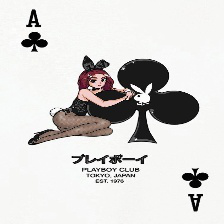

In [6]:
image , label = dataset[1]
image

In [7]:
# get a dict associating target values with folder names
data_dir='C:\\Users\\kaspa\\Desktop\\small_pt_project\\data\\train'
target_to_class = {v:k for k, v in ImageFolder(data_dir).class_to_idx.items()}

print(target_to_class)

{0: 'ace of clubs', 1: 'ace of diamonds', 2: 'ace of hearts', 3: 'ace of spades', 4: 'eight of clubs', 5: 'eight of diamonds', 6: 'eight of hearts', 7: 'eight of spades', 8: 'five of clubs', 9: 'five of diamonds', 10: 'five of hearts', 11: 'five of spades', 12: 'four of clubs', 13: 'four of diamonds', 14: 'four of hearts', 15: 'four of spades', 16: 'jack of clubs', 17: 'jack of diamonds', 18: 'jack of hearts', 19: 'jack of spades', 20: 'joker', 21: 'king of clubs', 22: 'king of diamonds', 23: 'king of hearts', 24: 'king of spades', 25: 'nine of clubs', 26: 'nine of diamonds', 27: 'nine of hearts', 28: 'nine of spades', 29: 'queen of clubs', 30: 'queen of diamonds', 31: 'queen of hearts', 32: 'queen of spades', 33: 'seven of clubs', 34: 'seven of diamonds', 35: 'seven of hearts', 36: 'seven of spades', 37: 'six of clubs', 38: 'six of diamonds', 39: 'six of hearts', 40: 'six of spades', 41: 'ten of clubs', 42: 'ten of diamonds', 43: 'ten of hearts', 44: 'ten of spades', 45: 'three of clu

ace of clubs


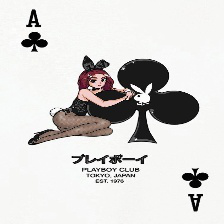

In [8]:
class_name = target_to_class[label]
print(class_name)
image

In [9]:
labels = [label for _, label in dataset]

unique_labels = set(labels)
label_counts = {target_to_class[label]: labels.count(label) for label in unique_labels}
df = pd.DataFrame(list(label_counts.items()), columns=['Class', 'Count'])
total_count = df['Count'].sum()

print(df)
print(f"Total Count: {total_count}")

                Class  Count
0        ace of clubs    120
1     ace of diamonds    129
2       ace of hearts    171
3       ace of spades    181
4      eight of clubs    138
5   eight of diamonds    159
6     eight of hearts    152
7     eight of spades    135
8       five of clubs    150
9    five of diamonds    138
10     five of hearts    136
11     five of spades    158
12      four of clubs    157
13   four of diamonds    114
14     four of hearts    154
15     four of spades    140
16      jack of clubs    171
17   jack of diamonds    160
18     jack of hearts    168
19     jack of spades    172
20              joker    115
21      king of clubs    128
22   king of diamonds    135
23     king of hearts    125
24     king of spades    151
25      nine of clubs    124
26   nine of diamonds    129
27     nine of hearts    133
28     nine of spades    154
29     queen of clubs    161
30  queen of diamonds    163
31    queen of hearts    139
32    queen of spades    162
33     seven o

### Create the Dataset and transform it as tensors

In [10]:
#consisten image size & transform as tensor - all images 128px x 128px
transform = transforms.Compose([
  transforms.Resize((128,128)),
  transforms.ToTensor(),
]
)

#load the data (train/valid/test) and transform it with our 'CardDataset' function
train_dir = 'C:\\Users\\kaspa\\Desktop\\small_pt_project\\data\\train'
valid_dir = 'C:\\Users\\kaspa\\Desktop\\small_pt_project\\data\\valid'
test_dir = 'C:\\Users\\kaspa\\Desktop\\small_pt_project\\data\\test'

# transform
train_dataset = CardDataset(train_dir,transform)
valid_dataset = CardDataset(valid_dir,transform)
test_dataset = CardDataset(test_dir,transform)


In [11]:
#check
image , label = train_dataset[1]
class_name = target_to_class[label]
image.shape, label, class_name # image is now a tensor


(torch.Size([3, 128, 128]), 0, 'ace of clubs')

In [12]:
# iterate over the dataset
for image, label in train_dataset:
  break

### Dataloaders (Batching)

In [13]:
train_loader = DataLoader(train_dataset,batch_size=32, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset,batch_size=32, shuffle=False)

In [14]:
#check
for images, labels in train_loader:
  break

images.shape, labels.shape

(torch.Size([32, 3, 128, 128]), torch.Size([32]))

 Images: [32 Images, 3 Channels (RGB) , 128px, 128px]
 
 Labels: [32 Labels, 1 Label]

## Step 2 - PyTorch Model

We use state of the art achitectures for image classification - we import them from packages like >>>timm<<<

In [15]:
import timm

In [16]:
class SimpleCardClassifer(nn.Module):
    
    def __init__(self, num_classes=53):

      super(SimpleCardClassifer,self).__init__() #initialize the object with everything from the parent class

      # define all the parts of the model
      self.base_model = timm.create_model('efficientnet_b0',pretrained=True)
      self.features = nn.Sequential(*list(self.base_model.children())[:-1]) #remove the last layer of the base_model

      enet_out_size = 1280
      
      # make a classifier
      self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(enet_out_size, num_classes)
        )

    def forward (self, x):
      # connect the parts and return the output

      x = self.features(x)
      output = self.classifier(x)
      
      return output

In [17]:
# check
model = SimpleCardClassifer(num_classes=53)
# print(model)

In [18]:
#check
example_out = model(images)
example_out.shape # [batch_size, num_classes]

torch.Size([32, 53])

## Step 3 - Train Loop

In [19]:
# using the GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [20]:
from tqdm import tqdm # progress bar

Validation loop: 100%|██████████| 9/9 [00:00<00:00, 25.73it/s]


Epoch1/13 - Current Learning Rate: 0.001 -Train loss 1.6505124852889983, Valid loss 0.5461087424800081
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 29.63it/s]


Epoch2/13 - Current Learning Rate: 0.001 -Train loss 0.5800434473554085, Valid loss 0.23318740196947782
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 29.95it/s]


Epoch3/13 - Current Learning Rate: 0.001 -Train loss 0.34668210491240964, Valid loss 0.25170387996817534
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 29.20it/s]


Epoch4/13 - Current Learning Rate: 0.001 -Train loss 0.24822601141234135, Valid loss 0.1498256930765116
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 29.32it/s]


Epoch5/13 - Current Learning Rate: 0.001 -Train loss 0.16503741330264873, Valid loss 0.18428191969979485
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 29.70it/s]


Epoch6/13 - Current Learning Rate: 0.001 -Train loss 0.17055449287669983, Valid loss 0.14536959146553616
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 28.83it/s]


Epoch7/13 - Current Learning Rate: 0.001 -Train loss 0.13668432650972326, Valid loss 0.14631278953462276
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 29.63it/s]


Epoch8/13 - Current Learning Rate: 0.001 -Train loss 0.11450051125588534, Valid loss 0.18087241604643048
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 27.81it/s]


Epoch9/13 - Current Learning Rate: 1e-06 -Train loss 0.10712314431300506, Valid loss 0.1713070602911823
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 30.00it/s]


Epoch10/13 - Current Learning Rate: 1e-06 -Train loss 0.09536022476750305, Valid loss 0.19012961961188407
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 30.05it/s]


Epoch11/13 - Current Learning Rate: 1e-09 -Train loss 0.09207504173469068, Valid loss 0.17366201888840155
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 27.64it/s]


Epoch12/13 - Current Learning Rate: 1e-09 -Train loss 0.08798921941061273, Valid loss 0.17688126991379935
---------------------------


Validation loop: 100%|██████████| 9/9 [00:00<00:00, 27.79it/s]


Epoch13/13 - Current Learning Rate: 1e-09 -Train loss 0.09329302945093165, Valid loss 0.16878836351745533
---------------------------


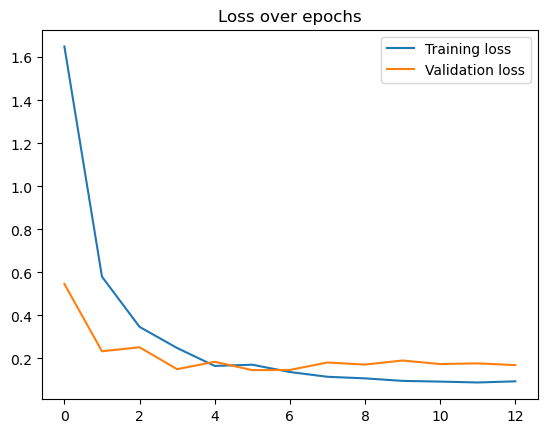

In [21]:
num_epochs = 13
train_losses, valid_losses = [], []

# Initalize the Model
model = SimpleCardClassifer(num_classes=53)
model.to(device) # via GPU

# Loss-Function
crit = nn.CrossEntropyLoss()
# Optimizer
opti = optim.Adam(model.parameters(),lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opti,  'min', factor=0.001, patience=1) #lr optimization


for epoch in range(num_epochs):
  
  # Train
  model.train()
  running_loss = 0.0

  
  for images, labels in tqdm(train_loader, desc='Training loop'):
      images, labels = images.to(device), labels.to(device) # via GPU

      opti.zero_grad()
      outputs = model(images)
      loss = crit(outputs, labels)

      # Backprop. & Optim.
      loss.backward()
      opti.step()

      running_loss += loss.item() * labels.size(0)

  train_loss = running_loss / len(train_loader.dataset)
  train_losses.append(train_loss)

  # Validation 
  model.eval()
  running_loss = 0.0

  with torch.no_grad():

      for images, labels in tqdm(val_loader, desc='Validation loop'):
        images, labels = images.to(device), labels.to(device) # via GPU
        outputs = model(images)
        loss = crit(outputs, labels)
        running_loss += loss.item() * labels.size(0)

  valid_loss = running_loss / len(val_loader.dataset)
  valid_losses.append(valid_loss)

  #track lr
  current_lr = opti.param_groups[0]['lr']
  scheduler.step(valid_loss)

  # Epoch states
  print(f'Epoch{epoch+1}/{num_epochs} - Current Learning Rate: {current_lr} -Train loss {train_loss}, Valid loss {valid_loss}\n---------------------------')


# Plot
plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.legend()
plt.title("Loss over epochs")
plt.show()

# Save the model parameters
torch.save(model.state_dict(), 'model_weights.pth')

## Accuracy/Precision/Recall/F1

In [22]:
# We use the saved paramters
model = SimpleCardClassifer(num_classes=53)
model.to(device)

# Loading the Saved Model Parameters
model.load_state_dict(torch.load('model_weights.pth'))

<All keys matched successfully>

In [23]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

**VALIDATION SET**

In [24]:
# Collection of Predictions and Actual Labels

model.eval() # Setting the Model to Evaluation Mode

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Conversion into NumPy Arrays for Sklearn Metrics
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Accuracy/Precision/Recall/F1
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='macro')  # oder 'micro'
recall = recall_score(all_labels, all_preds, average='macro')  # oder 'micro'
f1 = f1_score(all_labels, all_preds, average='macro')  # oder 'micro'

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

Accuracy: 0.9509433962264151
Precision: 0.9593890386343218
Recall: 0.9509433962264151
F1 Score: 0.9497236516104439


**TEST SET**

In [25]:
# Collection of Predictions and Actual Labels
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Conversion into NumPy Arrays for Sklearn Metrics
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Accuracy/Precision/Recall/F1
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='macro')  # oder 'micro'
recall = recall_score(all_labels, all_preds, average='macro')  # oder 'micro'
f1 = f1_score(all_labels, all_preds, average='macro')  # oder 'micro'

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

Accuracy: 0.9547169811320755
Precision: 0.964622641509434
Recall: 0.9547169811320755
F1 Score: 0.9527301838622593


## Evaluating the Results (using TEST DATA)

In [26]:
from PIL import Image

In [27]:
# Load and preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    return image, transform(image).unsqueeze(0)

# Predict using the model
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy().flatten()

# Visualization
def visualize_predictions(original_image, probabilities, class_names):
    fig, axarr = plt.subplots(1, 2, figsize=(14, 7))
    
    # Display image
    axarr[0].imshow(original_image)
    axarr[0].axis("off")
    
    # Display predictions
    axarr[1].barh(class_names, probabilities)
    axarr[1].set_xlabel("Probability")
    axarr[1].set_title("Class Predictions")
    axarr[1].set_xlim(0, 1)

    plt.tight_layout()
    plt.show()

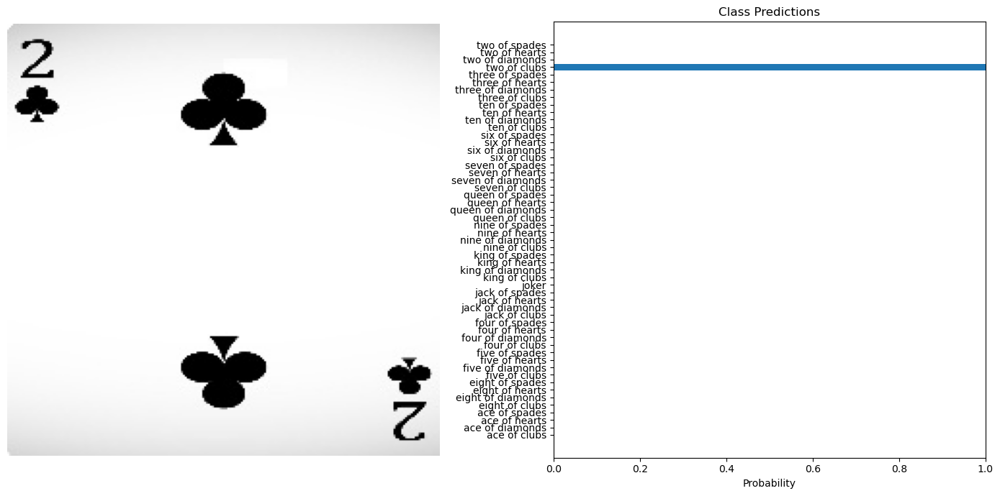

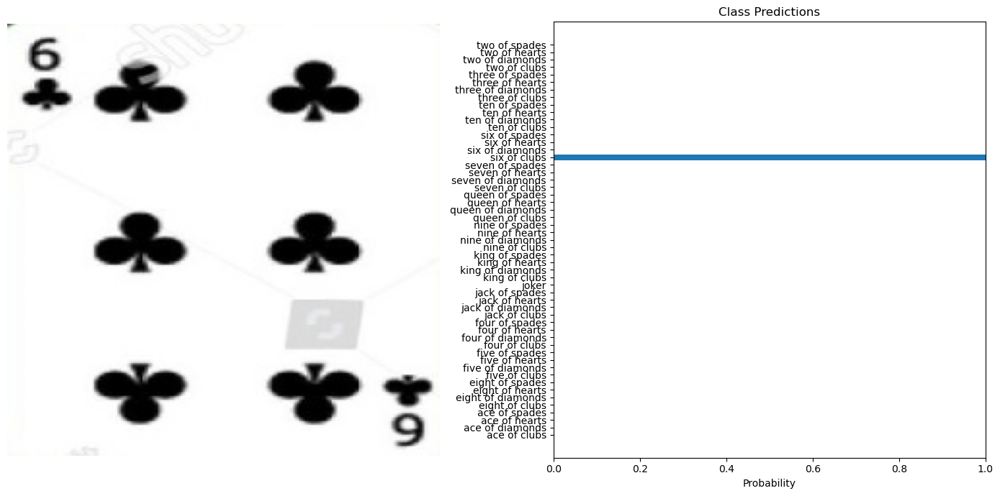

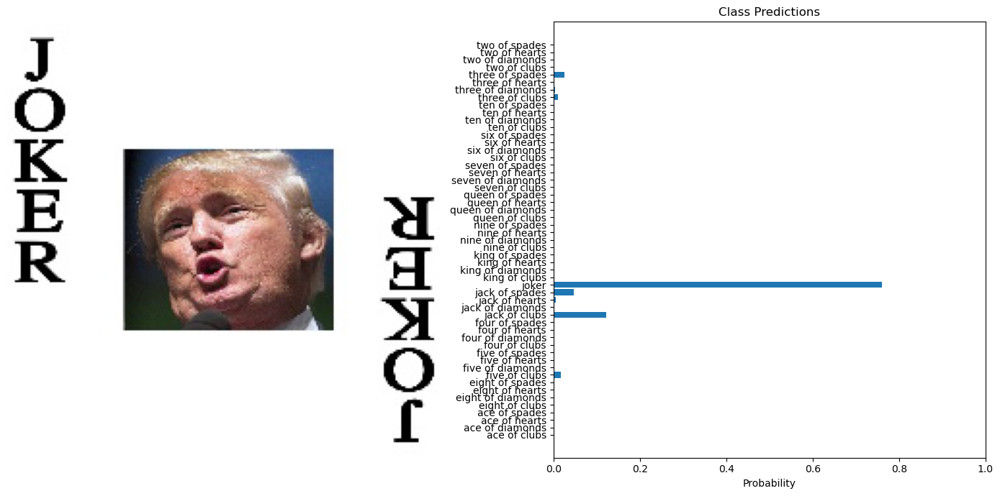

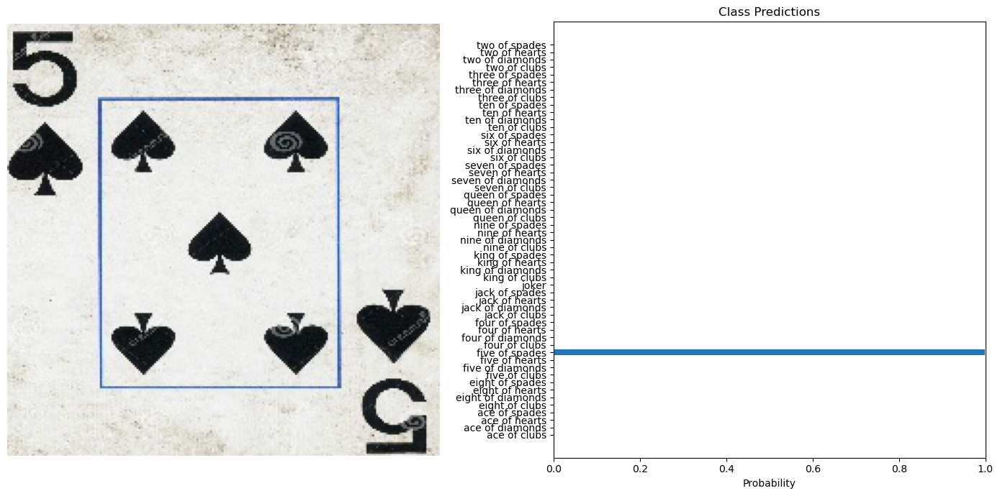

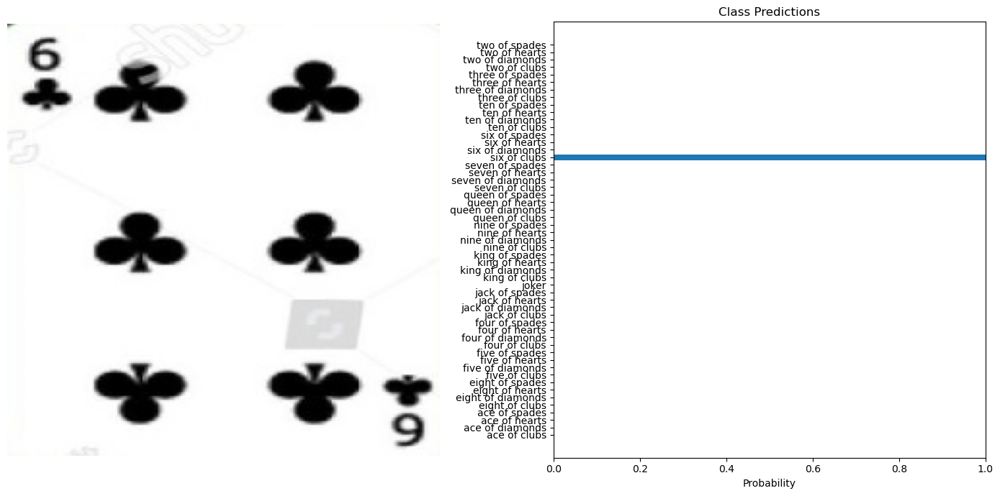

...

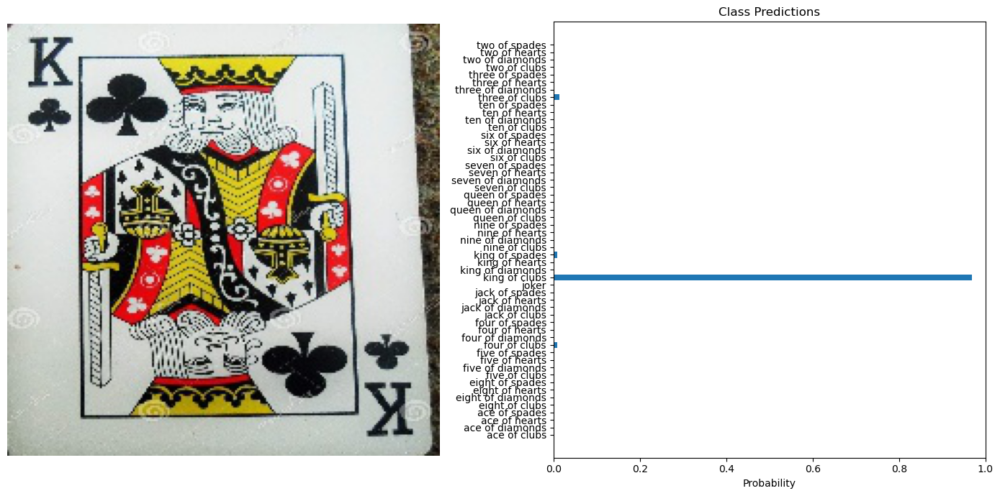

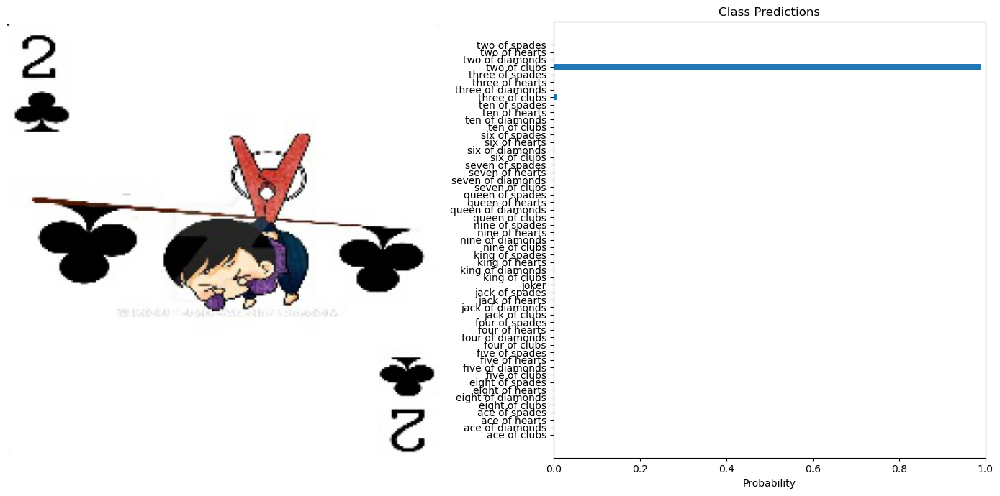

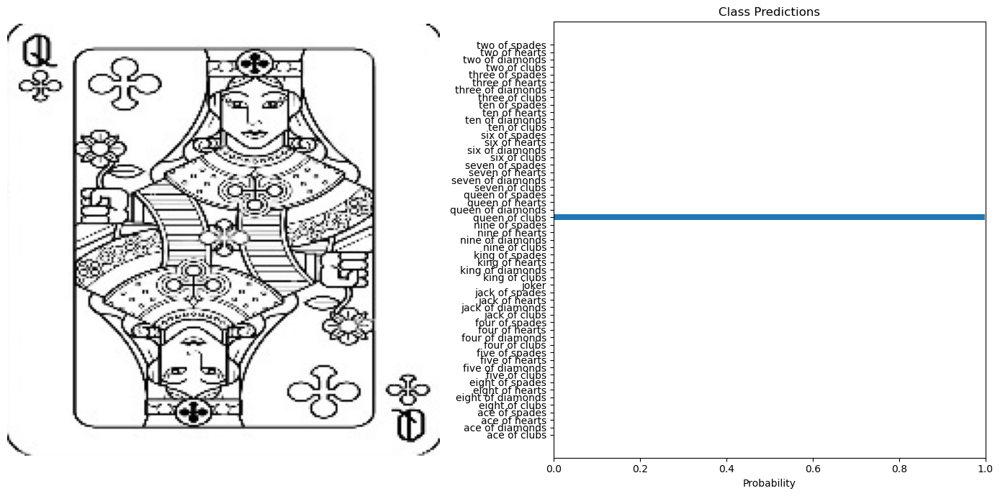

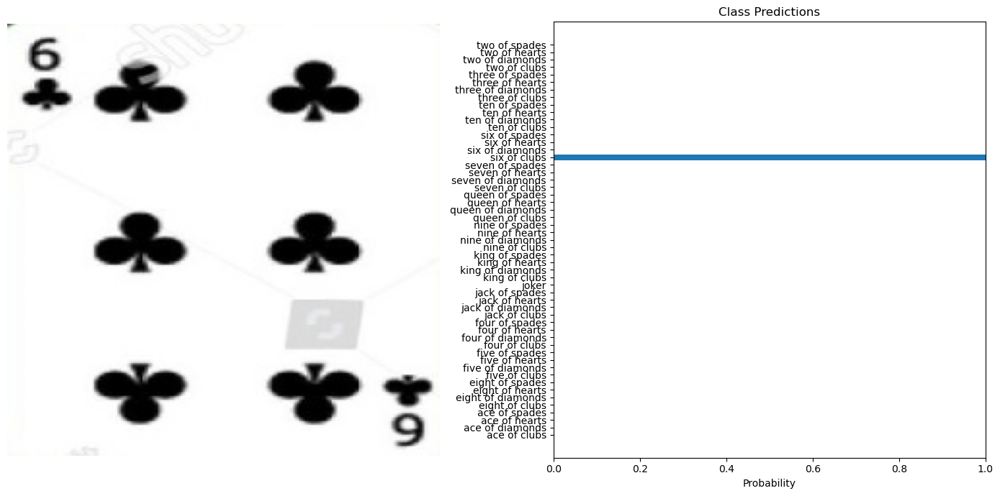

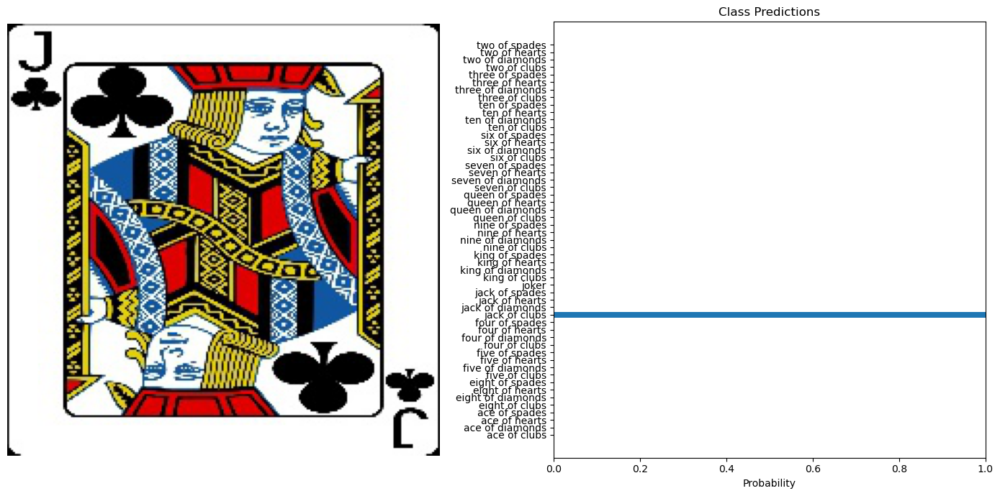

In [29]:
from glob import glob
#Desktop\\small_pt_project\\data\\
#../input/cards-image-datasetclassification/test/*/*
test_images = glob('C:\\Users\\kaspa\\Desktop\\small_pt_project\\data\\test\\*\\*')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example, transform)
    probabilities = predict(model, image_tensor, device)

    # Assuming dataset.classes gives the class names
    class_names = dataset.classes 
    visualize_predictions(original_image, probabilities, class_names)